In [1]:
import pickle
import warnings
import numpy as np 
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib import cm
from pathlib import Path
from matplotlib.colors import Normalize, TwoSlopeNorm

warnings.filterwarnings("ignore")

In [2]:
# Apply the default theme
sns.set_theme()

In [3]:
# getting the name of all files.

with open("my_list.txt", "r") as f:
    all_files = [line.strip() for line in f]

all_files[:10]

['raw_data/Cork Airport.csv',
 'raw_data/Killarney.csv',
 'raw_data/Waterford.csv',
 'raw_data/Cappoquinn.csv',
 'raw_data/Dublin Airport.csv',
 'raw_data/Phoenix Park.csv',
 'raw_data/Strokestown.csv',
 'raw_data/Athboy.csv',
 'raw_data/Belfast.csv',
 'raw_data/Enniscorthy.csv']

### In total, there are 26 files. 25 NAME.csv, containing monthly rainfall totals for each station in the network and 1 file `IIP_National series.csv` that contains the rainfall averaged over the 25 stations.

In [4]:
# Getting data from all files in to a single file.

all_station_info, rain_data_per_month, rain_data_per_year = {},  {}, {}

for file_name in all_files:
    
    if ".csv" in file_name:
        df = pd.read_csv(file_name) # Load CSV into a DataFrame
    
        # 1. Extract station info (first row, first 7 cols)
        station_info = [] if file_name == 'raw_data/IIP_National series.csv' else df.iloc[0, :7].tolist()
        
        all_station_info[file_name.split('/')[-1].replace('.csv', '')] = station_info
            
        # 2. Extract actual year–month table (starting row 2, row 1 is header)
        year_month_df = pd.DataFrame(df.iloc[2:].values, columns=df.iloc[1].values)
    
        # 3. Build dict per month (each month 161 values)
        result_dict_per_month = year_month_df.set_index("Year").astype(float).to_dict("list")
        rain_data_per_month[file_name.split('/')[-1].replace('.csv', '')] = result_dict_per_month
    
        # 4. Build dict per year (each year 12 values)
        result_dict_per_year = year_month_df.set_index("Year").T.astype(float).to_dict("list")
        rain_data_per_year[file_name.split('/')[-1].replace('.csv', '')] = result_dict_per_year

In [5]:
# The national series info list is empty. So, we'll remove it.

all_station_info['IIP_National series']

[]

In [6]:
# removing the national series

del all_station_info['IIP_National series']

## First, we should visualise the location of each station.

In [7]:
def stations_dict_to_df(d):
    cols = ["Easting","Northings","Latitude","Longitude","Elevation_m","Station","County"]
    df = (pd.DataFrame.from_dict(d, orient="index", columns=cols)
            .reset_index().rename(columns={"index":"StationKey"}))
    num = ["Easting","Northings","Latitude","Longitude","Elevation_m"]
    df[num] = df[num].apply(pd.to_numeric, errors="coerce")
    return df

def df_to_webmerc_from_irish_grid(df, src_crs="EPSG:29902"):  # use "EPSG:2157" if ITM
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df["Easting"], df["Northings"]),
        crs=src_crs
    )
    return gdf.to_crs(3857)  # Web Mercator

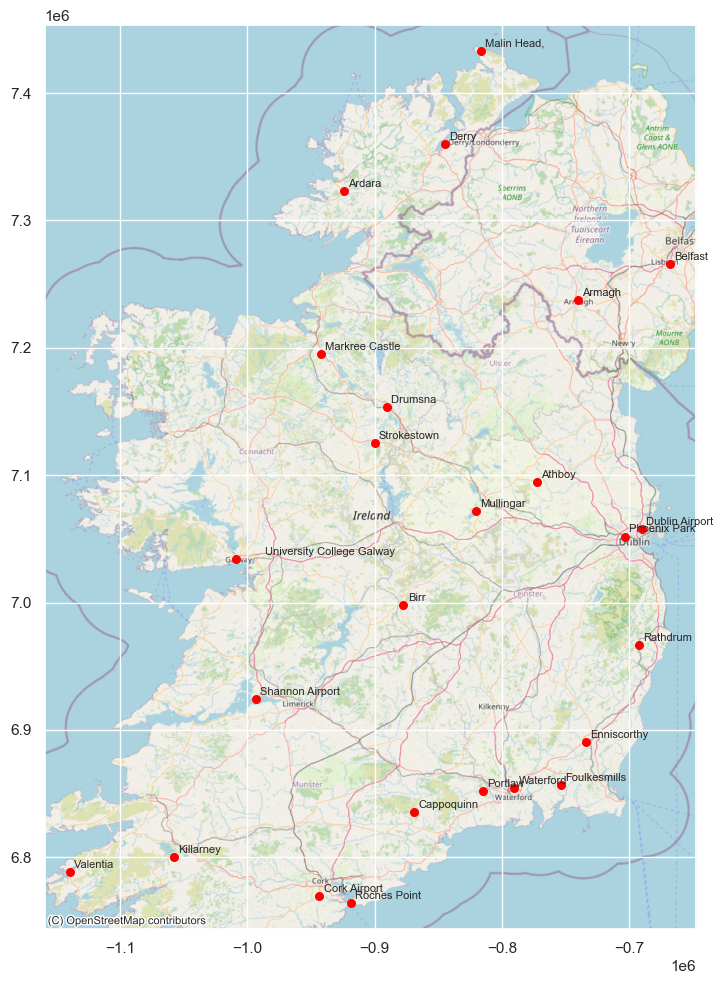

In [8]:
station_df = stations_dict_to_df(all_station_info)
gdf_web = df_to_webmerc_from_irish_grid(station_df, src_crs="EPSG:29902")

ax = gdf_web.plot(figsize=(8,10), markersize=30, color="red")
# optional: pad extent a bit so tiles load nicely
xmin, ymin, xmax, ymax = gdf_web.total_bounds
pad = 20_000
ax.set_xlim(xmin-pad, xmax+pad); ax.set_ylim(ymin-pad, ymax+pad)

cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)

for x, y, name in zip(gdf_web.geometry.x, gdf_web.geometry.y, gdf_web["Station"]):
    ax.annotate(name, (x, y), xytext=(3, 3), textcoords="offset points", fontsize=8)

plt.tight_layout()
plt.show()

## Analysing the IIP National Series Data.

- ### We've 
> **rain_data_per_month['IIP_National series']**
>
> **rain_data_per_year['IIP_National series']**

---
## Now, we can analyse the average variation in rainfall with respect to each month.

In [9]:
rain_data_per_month.keys()

dict_keys(['Cork Airport', 'Killarney', 'Waterford', 'Cappoquinn', 'Dublin Airport', 'Phoenix Park', 'Strokestown', 'Athboy', 'Belfast', 'Enniscorthy', 'Shannon Airport', 'Malin Head', 'Derry', 'Birr', 'Mullingar', 'Valentia', 'Rathdrum', 'Roches Point', 'Markree Castle', 'University College Galway', 'IIP_National series', 'Foulkesmills', 'Armagh', 'Portlaw', 'Ardara', 'Drumsna'])

In [10]:
rain_data_per_year.keys()

dict_keys(['Cork Airport', 'Killarney', 'Waterford', 'Cappoquinn', 'Dublin Airport', 'Phoenix Park', 'Strokestown', 'Athboy', 'Belfast', 'Enniscorthy', 'Shannon Airport', 'Malin Head', 'Derry', 'Birr', 'Mullingar', 'Valentia', 'Rathdrum', 'Roches Point', 'Markree Castle', 'University College Galway', 'IIP_National series', 'Foulkesmills', 'Armagh', 'Portlaw', 'Ardara', 'Drumsna'])

In [11]:
national_series_monthly = rain_data_per_month['IIP_National series']
national_series_yearly = rain_data_per_year['IIP_National series']

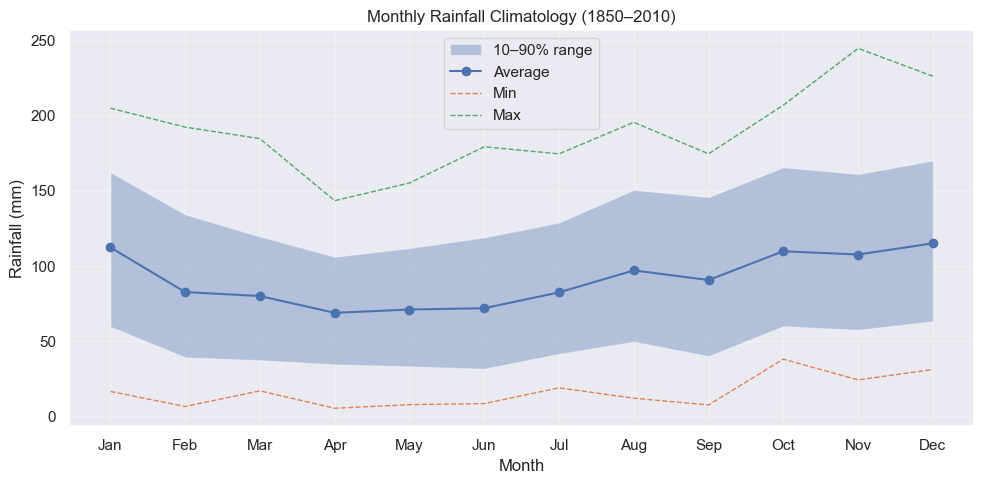

In [12]:
data_by_month = [np.array(national_series_monthly[m], dtype=float) for m in national_series_monthly]

min_per_month = [np.nanmin(a) for a in data_by_month]
max_per_month = [np.nanmax(a) for a in data_by_month]
avg_per_month = [np.nanmean(a) for a in data_by_month]
p10_per_month = [np.nanpercentile(a, 10) for a in data_by_month]
p90_per_month = [np.nanpercentile(a, 90) for a in data_by_month]

months = list(national_series_monthly.keys())

# --- plot: mean with percentile band, plus (optional) min/max as dashed outlines ---
plt.figure(figsize=(10, 5))

# typical variability band (10–90%)
plt.fill_between(months, p10_per_month, p90_per_month, alpha=0.35, label="10–90% range")

plt.plot(months, avg_per_month, marker="o", label="Average") # average line

# Note: extremes can be noisy
plt.plot(months, min_per_month, linestyle="--", linewidth=1, label="Min")
plt.plot(months, max_per_month, linestyle="--", linewidth=1, label="Max")

plt.title("Monthly Rainfall Climatology (1850–2010)")
plt.ylabel("Rainfall (mm)")
plt.xlabel("Month")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

## Now, we can visualise the variation in rainfall with respect to each year.

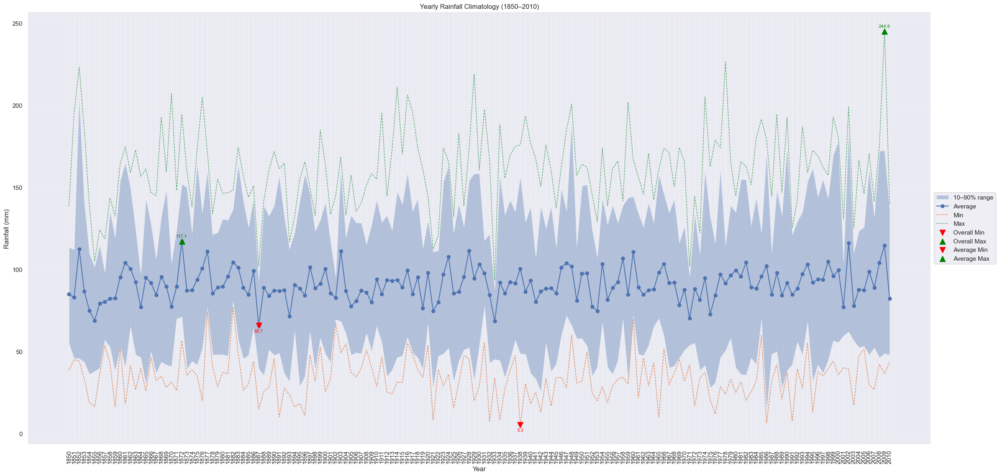

In [13]:
data_by_year = [np.array(national_series_yearly[m], dtype=float) for m in national_series_yearly]

min_per_year = [np.nanmin(a) for a in data_by_year]
max_per_year = [np.nanmax(a) for a in data_by_year]
avg_per_year = [np.nanmean(a) for a in data_by_year]
p10_per_year = [np.nanpercentile(a, 10) for a in data_by_year]
p90_per_year = [np.nanpercentile(a, 90) for a in data_by_year]

years = list(national_series_yearly.keys())

# --- plot: mean with percentile band, plus (optional) min/max as dashed outlines ---
plt.figure(figsize=(25, 12))

# typical variability band (10–90%)
plt.fill_between(years, p10_per_year, p90_per_year, alpha=0.35, label="10–90% range")

plt.plot(years, avg_per_year, marker="o", label="Average") # average line

# Note: extremes can be noisy
plt.plot(years, min_per_year, linestyle="--", linewidth=1, label="Min")
plt.plot(years, max_per_year, linestyle="--", linewidth=1, label="Max")

# mark extremes (overall and average) 
overall_min_idx = int(np.argmin(min_per_year))
overall_max_idx = int(np.argmax(max_per_year))
avg_min_idx     = int(np.argmin(avg_per_year))
avg_max_idx     = int(np.argmax(avg_per_year))

overall_min_year = years[overall_min_idx]
overall_max_year = years[overall_max_idx]
avg_min_year     = years[avg_min_idx]
avg_max_year     = years[avg_max_idx]

overall_min_val = float(min_per_year[overall_min_idx])
overall_max_val = float(max_per_year[overall_max_idx])
avg_min_val     = float(avg_per_year[avg_min_idx])
avg_max_val     = float(avg_per_year[avg_max_idx])

# markers
plt.scatter(overall_min_year, overall_min_val, s=100, marker="v", color="red",   zorder=5, label="Overall Min")
plt.scatter(overall_max_year, overall_max_val, s=100, marker="^", color="green", zorder=5, label="Overall Max")
plt.scatter(avg_min_year,     avg_min_val,     s=100, marker="v", color="red",   zorder=5, label="Average Min")
plt.scatter(avg_max_year,     avg_max_val,     s=100, marker="^", color="green", zorder=5, label="Average Max")

# value labels
plt.text(overall_min_year, overall_min_val-2, f"{overall_min_val:.1f}",
         ha="center", va="top", fontsize=8, color="red")
plt.text(overall_max_year, overall_max_val+2, f"{overall_max_val:.1f}",
         ha="center", va="bottom", fontsize=8, color="green")
plt.text(avg_min_year,     avg_min_val-2,     f"{avg_min_val:.1f}",
         ha="center", va="top", fontsize=8, color="red")
plt.text(avg_max_year,     avg_max_val+2,     f"{avg_max_val:.1f}",
         ha="center", va="bottom", fontsize=8, color="green")

plt.title("Yearly Rainfall Climatology (1850–2010)")
plt.ylabel("Rainfall (mm)")
plt.xlabel("Year")

plt.xticks(rotation=90) # Rotate y-axis tick labels

plt.grid(alpha=0.3)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

plt.legend(by_label.values(), by_label.keys(),
           loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

## Lets visualise, the annual (sum of all months) rainfall recorded by each station.

In [14]:
each_year_total_rainfall_per_station = {}

for station, rain_per_year in rain_data_per_year.items():
    if station != 'IIP_National series':
        total_rain = []
        for year, rain_series in rain_per_year.items():
            total_rain.append(sum(rain_series)) # Sum of rain in each month.
        each_year_total_rainfall_per_station[station] = total_rain

len(each_year_total_rainfall_per_station['Cork Airport'])

161

In [15]:
def build_year_matrix(station_to_series: dict, start_year=1850) -> pd.DataFrame:
    """
    station_to_series: {"StationA": [y0, y1, ...], "StationB": [...], ...}
                       each list is annual values in chronological order
    Returns DataFrame with rows=stations, cols=years
    """
    # Determine length from the first station
    first = next(iter(station_to_series.values()))
    n_years = len(first)
    years = list(range(start_year, start_year + n_years))
    df = pd.DataFrame(index=station_to_series.keys(), columns=years, dtype=float)
    for stn, vals in station_to_series.items():
        df.loc[stn] = pd.Series(vals, index=years)
    return df


df = build_year_matrix(each_year_total_rainfall_per_station)
df.head()

,1850,1851,1852,1853,1854,1855,1856,1857,1858,1859,...,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010
Cork Airport,1200.4,1052.4,1377.5,1222.9,740.1,860.9,1187.7,1180.1,1324.7,1293.1,...,1075.0,1540.0,967.0,1116.0,1191.0,1199.0,1058.0,1341.0,1562.0,907.0
Killarney,1383.6,1333.8,1774.8,1484.7,1112.8,1133.7,1413.2,1353.5,1424.6,1467.7,...,1242.2,1841.7,1193.8,1416.4,1459.7,1653.5,1397.7,1680.6,1880.4,1132.3
Waterford,886.4,907.5,1397.8,1084.2,715.8,812.5,925.1,900.1,825.2,732.6,...,1040.1,1379.0,865.5,888.9,986.8,1217.6,955.4,1156.4,1401.4,1023.3
Cappoquinn,1338.4,1262.9,1839.7,1474.6,1064.6,1175.3,1306.4,1285.1,1315.6,1290.6,...,1264.2,1747.9,1226.5,1315.1,1251.2,1415.4,1259.7,1439.8,1885.2,1313.3
Dublin Airport,684.7,642.8,1018.0,708.1,608.0,636.0,634.6,588.7,612.0,567.9,...,631.0,1097.0,654.0,699.4,684.0,741.0,729.0,945.4,918.0,672.0


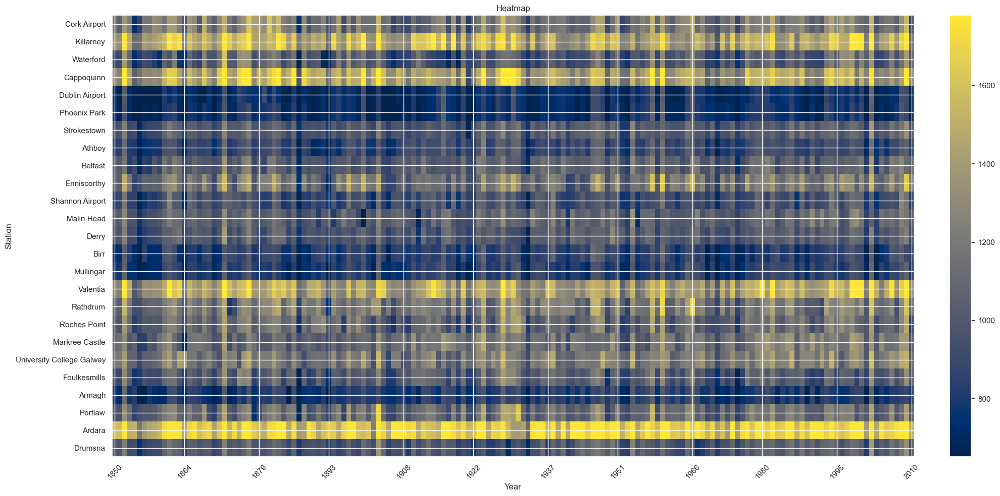

In [16]:
def plot_heatmap(df,
                        title="Heatmap",
                        cmap="cividis",          # good, colorblind-friendly sequential
                        robust=True,             # clip by percentiles
                        lower_pct=2, upper_pct=98,
                        diverging=False,         # use diverging colormap around 'center'
                        center=0.0,              # center value for diverging norm (e.g., 0 for anomalies/z-scores)
                        bad_color="#f0f0f0"):    # NaN color
    M = df.values.astype(float)

    # Robust vmin/vmax (ignore NaNs)
    finite_vals = M[np.isfinite(M)]
    if finite_vals.size == 0:
        vmin, vmax = 0, 1
    else:
        if robust:
            vmin = np.percentile(finite_vals, lower_pct)
            vmax = np.percentile(finite_vals, upper_pct)
        else:
            vmin, vmax = np.nanmin(M), np.nanmax(M)

    # Choose normalization
    if diverging:
        # ensure symmetric-ish limits around center
        spread = max(center - vmin, vmax - center)
        norm = TwoSlopeNorm(vmin=center - spread, vcenter=center, vmax=center + spread)
    else:
        norm = Normalize(vmin=vmin, vmax=vmax)

    plt.figure(figsize=(20, 10))
    im = plt.imshow(M, aspect="auto", cmap=cmap, norm=norm)
    im.cmap.set_bad(bad_color)

    # axes & labels
    plt.yticks(range(len(df.index)), list(df.index))
    xticks = np.linspace(0, M.shape[1]-1, num=min(12, M.shape[1]), dtype=int)
    plt.xticks(xticks, [df.columns[i] for i in xticks], rotation=45)
    plt.xlabel("Year")
    plt.ylabel("Station")
    plt.title(title)

    cbar = plt.colorbar(im, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


plot_heatmap(df)

## From our heatmap,
- **Dublin Airport, Phoenix Park, Birr, Mullingar** and **Armagh** generally recorded less rainfall than other stations throughout the years.
- **Ardara** and **Killarney** recorded the most rainfall throughout the years.
- We can also visualise how the average rainfall variation at these station compares with the national average.

In [17]:
# using this function, we can compare the variation in rainfall for multiple stations.

def multi_station_comparison(station_list, fig_size=(25, 12), x_label="Month"):
    """
    station_list: list of dict keys like 'Killarney'
    x_label: "Month" or "Year" (controls which dataset is used and the x-axis label)
    """

    # --- pick datasets and build station records ---
    station_records = {}

    if x_label == "Month":
        national_series = national_series_monthly.copy()
        dataset = rain_data_per_month
        x_title = "Month"
    else:
        national_series = national_series_yearly.copy()
        dataset = rain_data_per_year
        x_title = "Year"

    # gather selected stations
    for station in station_list:
        station_series = dataset[station]
        # keep original order of keys as provided in the dict
        station_data  = [np.array(station_series[k], dtype=float) for k in station_series]
        station_name  = Path(station).stem
        station_records[station_name] = station_data

    # x-axis labels from national (assumed consistent)
    x_axis_labels = list(national_series.keys())

    # --- national averages (ignore NaNs) ---
    national_data = [np.array(national_series[k], dtype=float) for k in national_series]
    national_avg  = [np.nanmean(a) for a in national_data]

    # --- plot ---
    plt.figure(figsize=fig_size, dpi=140)

    # palette for many stations
    palette = list(cm.tab20.colors) + list(cm.tab20b.colors) + list(cm.tab20c.colors)

    # plot station lines
    handles, labels = [], []
    for idx, (name, data_arrays) in enumerate(station_records.items()):
        station_avg = [np.nanmean(a) for a in data_arrays]
        h, = plt.plot(
            x_axis_labels, station_avg,
            marker="o", markersize=4, linewidth=1.6, alpha=0.9,
            color=palette[idx % len(palette)],
            label=name, zorder=2
        )
        handles.append(h); labels.append(name)

    # plot national reference last so it sits on top
    h_nat, = plt.plot(
        x_axis_labels, national_avg,
        marker="o", markersize=6, linewidth=3.0, alpha=1.0,
        color="black", label="National (ref)", zorder=4
    )
    handles.insert(0, h_nat)
    labels.insert(0, "National (ref)")

    # titles/axes
    title = f"Average {x_title}ly Rainfall — Selected Stations vs National Reference"
    plt.title(title, fontsize=18, fontweight="bold")
    plt.xlabel(x_title, fontsize=14)
    plt.ylabel("Rainfall (mm)", fontsize=14)
    plt.xticks(rotation=90, fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(alpha=0.3)

    # legend outside, multi-column if many stations
    ncols = 2 if len(labels) <= 18 else 3
    plt.legend(handles, labels, loc="center left", bbox_to_anchor=(1.01, 0.5),
               ncol=ncols, fontsize="small", title="Series", title_fontsize="medium")

    plt.tight_layout()
    plt.show()

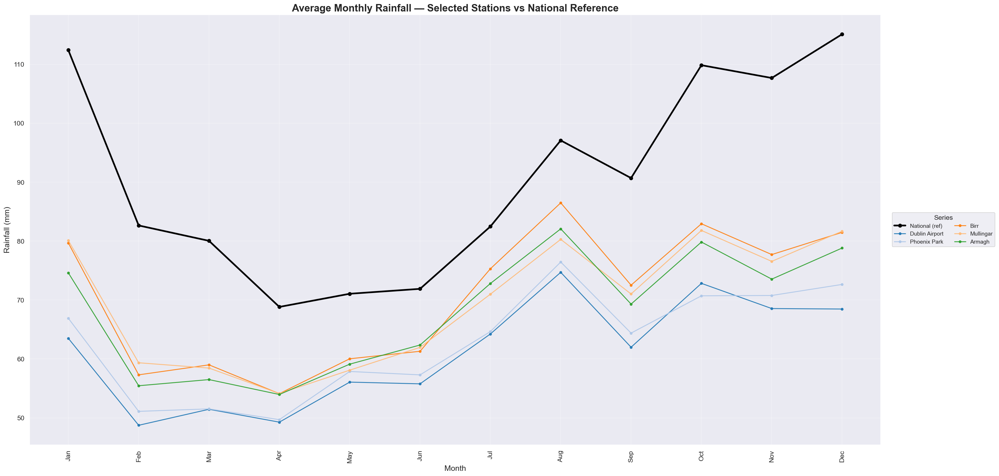

In [18]:
station_list = ["Dublin Airport", "Phoenix Park", "Birr", "Mullingar", "Armagh"] 
multi_station_comparison(station_list, fig_size=(25, 12), x_label="Month")

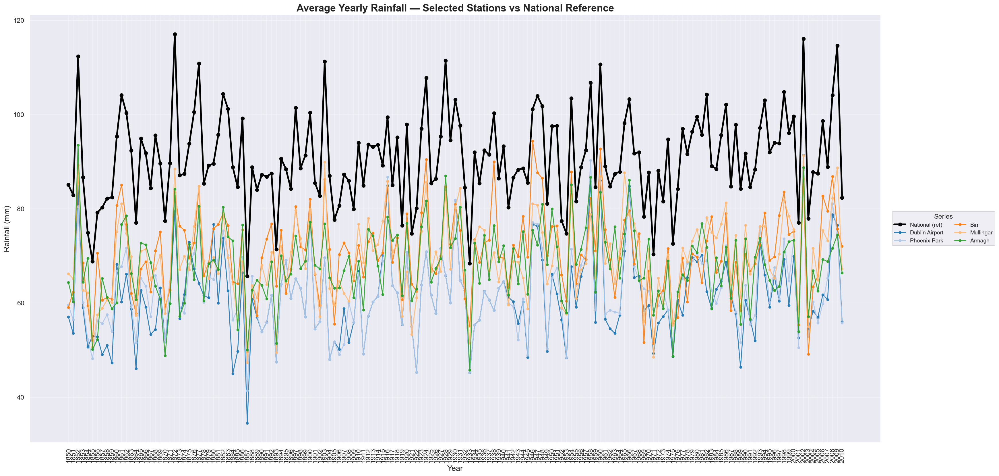

In [19]:
multi_station_comparison(station_list, fig_size=(25, 12), x_label="Year")

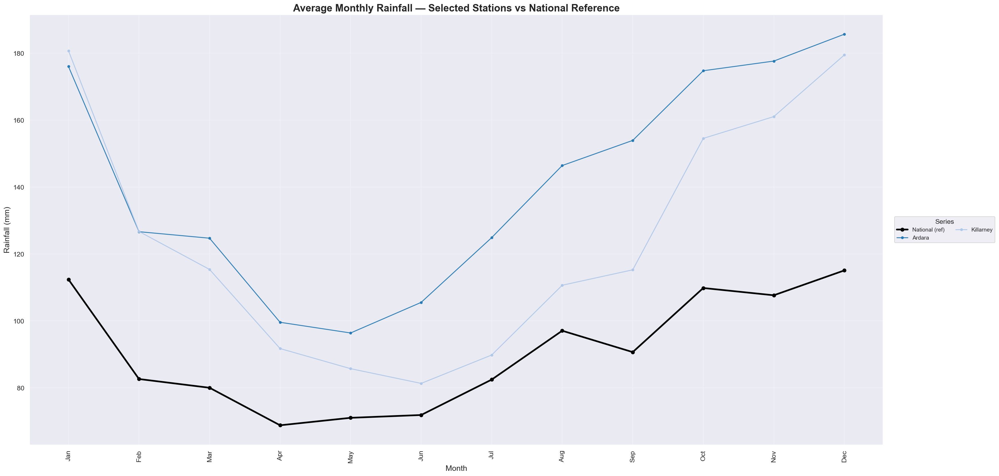

In [20]:
station_list = ["Ardara", "Killarney"] 
multi_station_comparison(station_list, fig_size=(25, 12), x_label="Month")

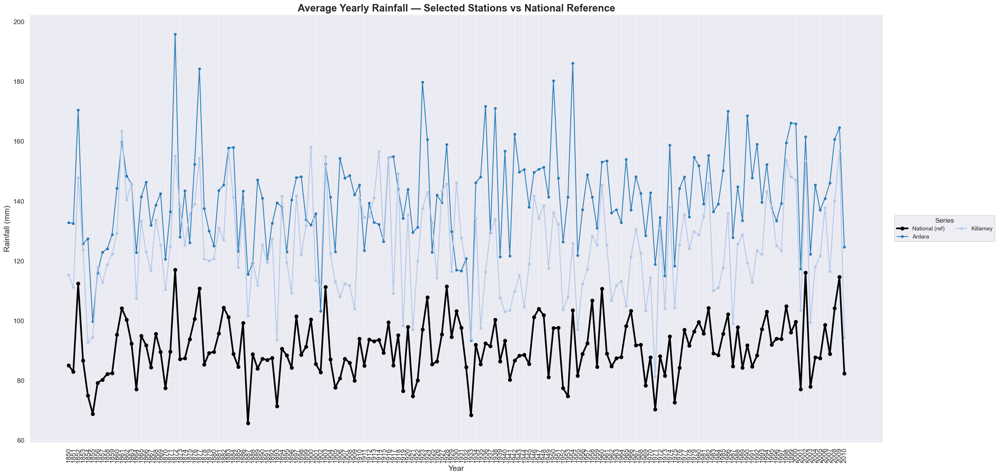

In [21]:
station_list = ["Ardara", "Killarney"] 
multi_station_comparison(station_list, fig_size=(25, 12), x_label="Year")

## Similarly, we can visualise the variation of all stations with respect to the national.

In [22]:
rain_data_per_month.keys()

dict_keys(['Cork Airport', 'Killarney', 'Waterford', 'Cappoquinn', 'Dublin Airport', 'Phoenix Park', 'Strokestown', 'Athboy', 'Belfast', 'Enniscorthy', 'Shannon Airport', 'Malin Head', 'Derry', 'Birr', 'Mullingar', 'Valentia', 'Rathdrum', 'Roches Point', 'Markree Castle', 'University College Galway', 'IIP_National series', 'Foulkesmills', 'Armagh', 'Portlaw', 'Ardara', 'Drumsna'])

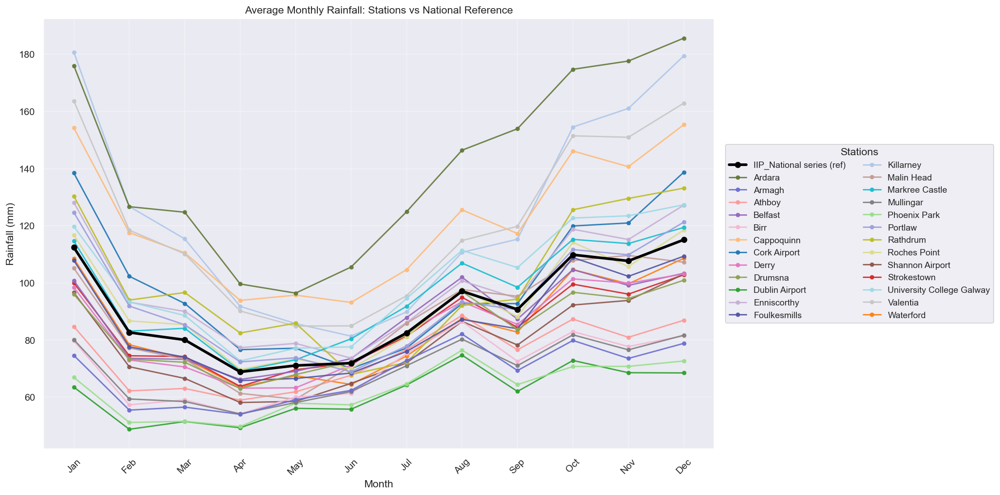

In [23]:
x_axis_labels = list(rain_data_per_month['Killarney'].keys()) # same for all stations

plt.figure(figsize=(16, 8), dpi=140)

# Build a big qualitative palette (60 colors)
palette = list(cm.tab20.colors) + list(cm.tab20b.colors) + list(cm.tab20c.colors)

handles, labels = [], []

for idx, (path, series) in enumerate(rain_data_per_month.items()):
    data_to_plot = [np.array(series[m], dtype=float) for m in series]
    data_avg = [np.nanmean(a) for a in data_to_plot]
    name = Path(path).stem

    is_national = ("national" in name.lower()) or ("iip_national" in name.lower())

    color = "black" if is_national else palette[idx % len(palette)]
    lw    = 3.0 if is_national else 1.6
    msz   = 6 if is_national else 4
    z     = 4 if is_national else 2
    alpha = 1.0 if is_national else 0.9

    h, = plt.plot(x_axis_labels, data_avg, marker="o", markersize=msz,
                  linewidth=lw, alpha=alpha, color=color,
                  label=(f"{name} (ref)" if is_national else name), zorder=z)
    handles.append(h); labels.append(h.get_label())

# Titles/axes
plt.title("Average Monthly Rainfall: Stations vs National Reference")
plt.xlabel("Month")
plt.ylabel("Rainfall (mm)")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)

# Legend: outside, multi-column, small font
# Put reference first
order = sorted(range(len(labels)), key=lambda i: (0 if "ref" in labels[i].lower() else 1, labels[i].lower()))
handles = [handles[i] for i in order]
labels  = [labels[i]  for i in order]

plt.legend(handles, labels,
           loc="center left", bbox_to_anchor=(1.01, 0.5),
           ncol=2, fontsize="small", title="Stations")

plt.tight_layout()
plt.show()


## Some stations record average monthly rainfall well above the national average, while others are well below. Since we also have **elevation** data for each station, we can examine how rainfall relates to **elevation**.

In [24]:
all_station_info['Killarney'][4], all_station_info['Cork Airport'][4]

('54', '154')

In [25]:
df1, df2 = pd.read_csv('raw_data/Killarney.csv'), pd.read_csv('raw_data/Cork Airport.csv')

df1['elevation (metres)'][0], df2['elevation (metres)'][0]

('54', '154')

### In our `all_station_info` dictionary, the 5th element (index 4) in each station’s detail list represents the station’s elevation in meters.

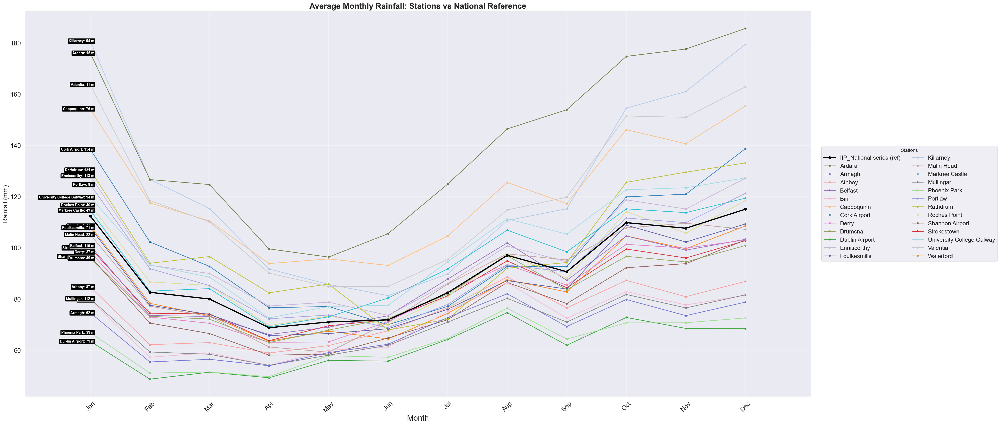

In [26]:
x_axis_labels = list(rain_data_per_month['Killarney'].keys())  # same for all stations

plt.figure(figsize=(35, 15), dpi=140)
ax = plt.gca()                      # get axes
ax.margins(x=0.10)  

# Build a big qualitative palette (60 colors)
palette = list(cm.tab20.colors) + list(cm.tab20b.colors) + list(cm.tab20c.colors)

handles, labels = [], []

for idx, (path, series) in enumerate(rain_data_per_month.items()):
    data_to_plot = [np.array(series[m], dtype=float) for m in series]
    data_avg = [np.nanmean(a) for a in data_to_plot]
    name = Path(path).stem

    is_national = ("national" in name.lower()) or ("iip_national" in name.lower())

    color = "black" if is_national else palette[idx % len(palette)]
    lw    = 3.0 if is_national else 1.6
    msz   = 6 if is_national else 4
    z     = 4 if is_national else 2
    alpha = 1.0 if is_national else 0.9

    h, = plt.plot(x_axis_labels, data_avg, marker="o", markersize=msz,
                  linewidth=lw, alpha=alpha, color=color,
                  label=(f"{name} (ref)" if is_national else name), zorder=z)
    handles.append(h); labels.append(h.get_label())

    # --- NEW: annotate elevation at the start of the line (skip for national) ---
    if not is_national:
        # safely get elevation from all_station_info[path][4]
        elev = None
        vals = all_station_info.get(path)
        if isinstance(vals, (list, tuple)) and len(vals) > 4:
            try:
                elev = float(str(vals[4]).strip())
            except Exception:
                elev = None

        if elev is not None and len(data_avg) > 0:
            x0 = x_axis_labels[0]
            y0 = data_avg[0]
            plt.annotate(
                        f"{path.split('/')[-1].replace('.csv', '')}: {int(round(elev))} m",
                        xy=(x0, y0),
                        xytext=(10, 0),  # offset left
                        textcoords="offset points",
                        ha="right", va="center",
                        color="white",             # white text for contrast
                        fontsize=9, fontweight="bold",
                        zorder=z+2,
                        bbox=dict(boxstyle="round,pad=0.25", fc="black", ec="white", lw=0.4, alpha=1.0)
)


# Titles/axes
plt.title("Average Monthly Rainfall: Stations vs National Reference", fontsize=20, fontweight="bold")
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=16)
plt.xticks(rotation=45, fontsize=16)
plt.yticks(fontsize=16)
plt.grid(alpha=0.3)

# Legend: outside, multi-column, small font
# Put reference first
order = sorted(range(len(labels)), key=lambda i: (0 if "ref" in labels[i].lower() else 1, labels[i].lower()))
handles = [handles[i] for i in order]
labels  = [labels[i]  for i in order]

plt.legend(handles, labels,
           loc="center left", bbox_to_anchor=(1.01, 0.5),
           ncol=2, fontsize="large", title="Stations")

plt.tight_layout()
plt.show()

### We can also visualise the data from some of the high-elevation and low-elevation stations in comparison with the national average.
- #### First we need to arrange the stations in order of elevation.
- #### We'll need to remove the national series, as it doesn't have elevation.

In [27]:
# arranging order as per elevation.

sorted_elevation = sorted(all_station_info.items(), key = lambda x: int(x[1][4]), reverse = True)

In [28]:
# Top 3 high elevation stations
sorted_elevation[:3]

[('Cork Airport',
  ['167336.07',
   '64387.09',
   '51.831302',
   '-8.4745107',
   '154',
   'Cork Airport',
   'Cork']),
 ('Rathdrum',
  ['319700',
   '186000',
   '52.916983',
   '-6.226596',
   '131',
   'Rathdrum',
   'Wicklow']),
 ('Belfast',
  ['329623.38',
   '363141.29',
   '54.5001179',
   '-5.9999275',
   '115',
   'Belfast',
   'Antrim'])]

In [29]:
# Top 3 low elevation stations
sorted_elevation[-3:]

[('Valentia',
  ['46471.78',
   '78165.16',
   '51.9352866',
   '-10.232517',
   '11',
   'Valentia ',
   'Kerry']),
 ('Portlaw',
  ['246600',
   '115200',
   '52.2869497',
   '-7.3177773',
   '8',
   'Portlaw',
   'Waterford']),
 ('Shannon Airport',
  ['137792',
   '159203.87',
   '52.6807753',
   '-8.9205048',
   '6',
   'Shannon Airport',
   'Limerick'])]

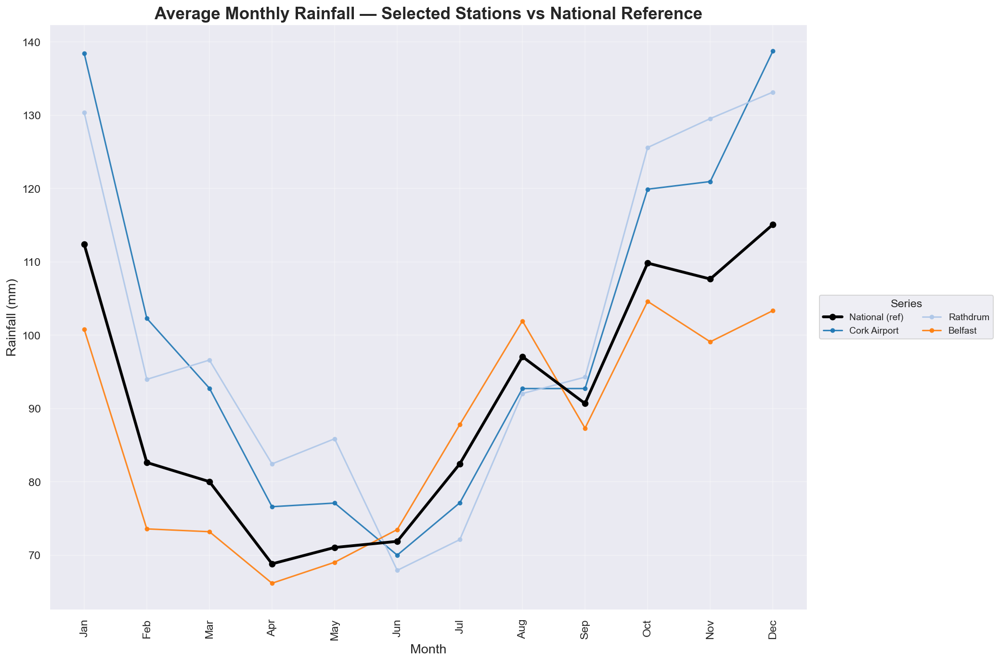

In [30]:
high_elevation_stations = [i[0] for i in sorted_elevation[:3]]

multi_station_comparison(high_elevation_stations, fig_size=(15, 10))

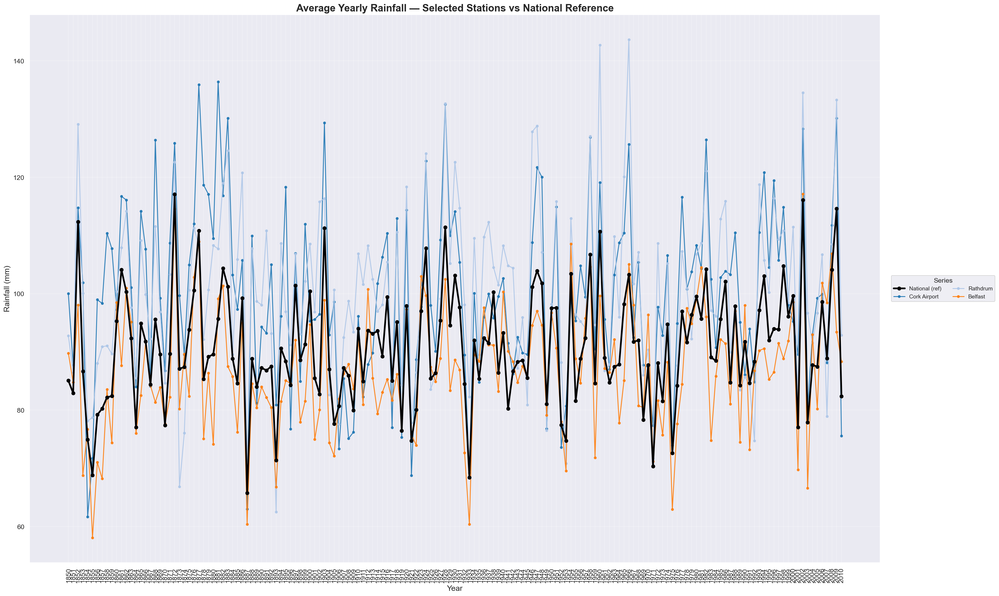

In [31]:
multi_station_comparison(high_elevation_stations, fig_size=(25, 15), x_label="Year")

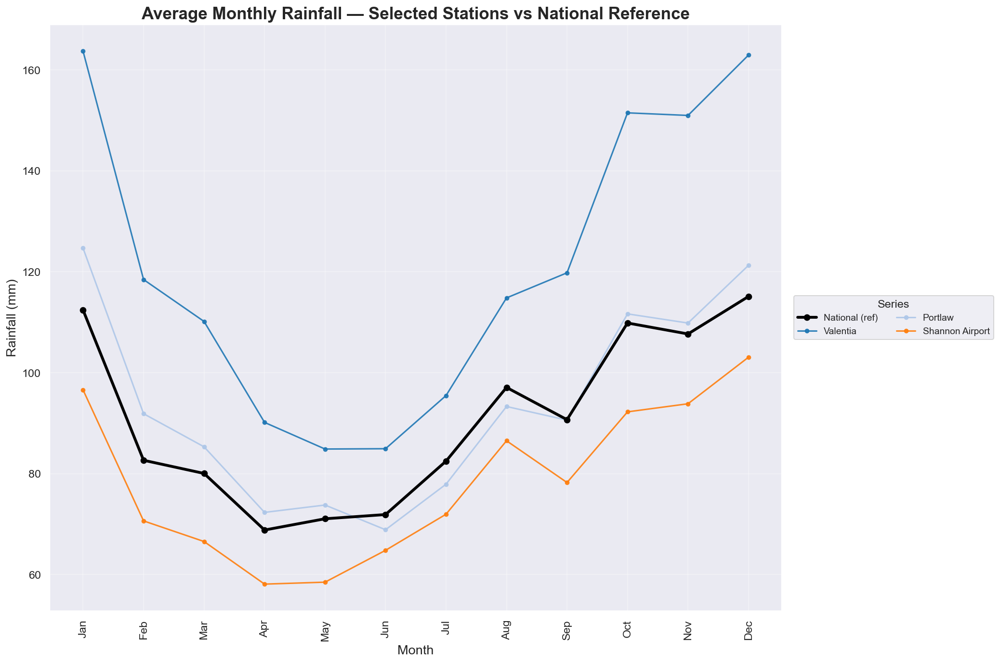

In [32]:
low_elevation_stations = [i[0] for i in sorted_elevation[-3:]]

multi_station_comparison(low_elevation_stations, fig_size=(15, 10), x_label="Month")

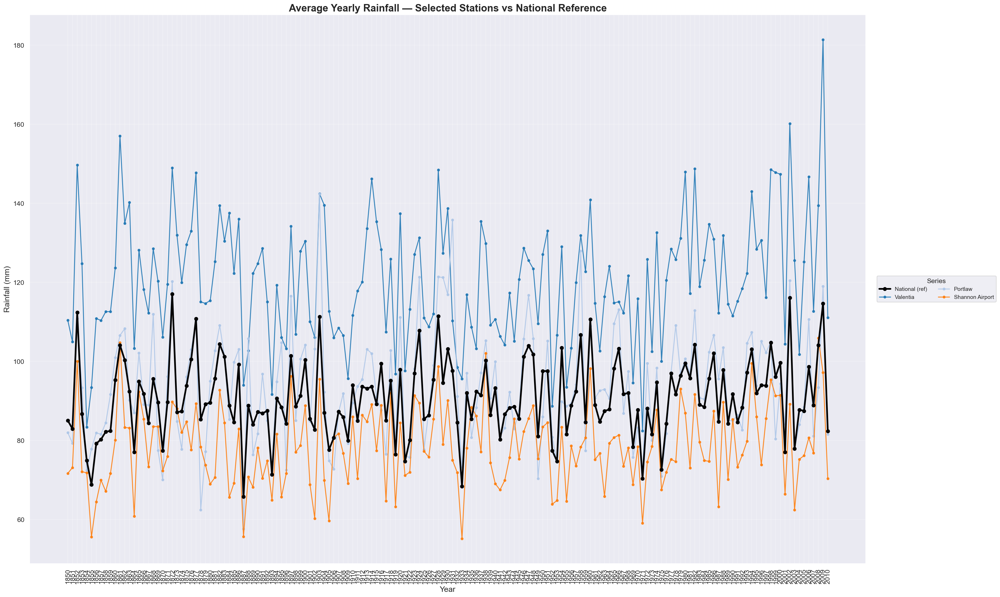

In [33]:
multi_station_comparison(low_elevation_stations, fig_size=(25, 15), x_label="Year")

In [34]:
def save_pickle(obj, path):
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    with open(path, "wb") as f:
        pickle.dump(obj, f, protocol=pickle.HIGHEST_PROTOCOL)


bundle = {
    "rain_data_per_month": rain_data_per_month,
    "rain_data_per_year": rain_data_per_year,
    "all_station_info": all_station_info,
}
save_pickle(bundle, "irish_rain_bundle.pkl")